In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap, DualMap, HeatMapWithTime



In [27]:
data = pd.read_csv("../../../Police_Department_Incident_Reports__Historical_2003_to_May_2018_20240205.csv")


# Prepare data

In [28]:
data['Date'] = pd.to_datetime(data["Date"])
data["Year"] = data['Date'].dt.year #dt er datetime accessor

data['Time'] = pd.to_datetime(data['Time'], format='%H:%M').dt.time
data['Hour'] = data['Time'].apply(lambda x: x.hour)

In [30]:
data['X']

0         -122.420084
1         -120.500000
2         -120.500000
3         -122.436220
4         -122.410541
              ...    
2129520   -122.398699
2129521   -122.443312
2129522   -122.387068
2129523   -122.412515
2129524   -122.451217
Name: X, Length: 2129525, dtype: float64

## Time series/bar chart

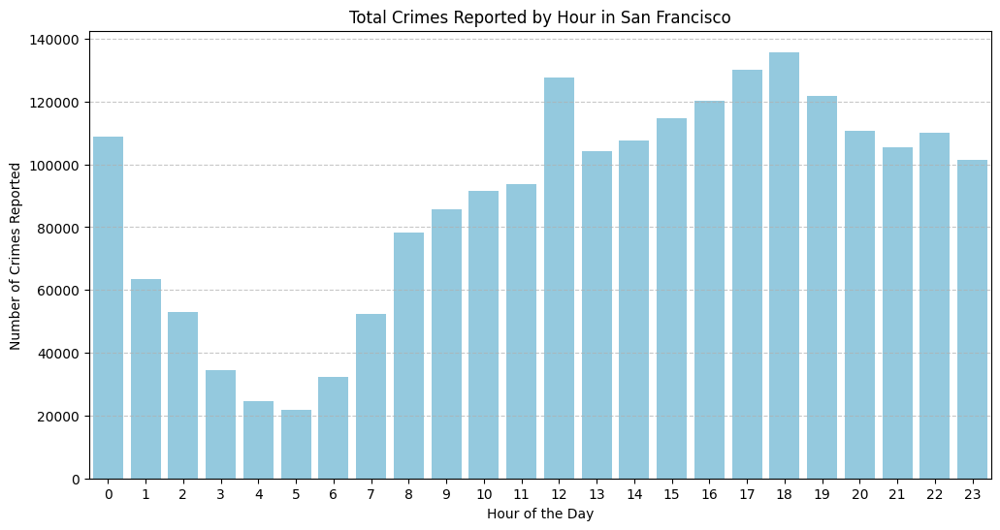

In [16]:
crimes_by_hour = data.groupby('Hour').size().reset_index(name='Counts')

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=crimes_by_hour, x='Hour', y='Counts', color='skyblue')

plt.title('Total Crimes Reported by Hour in San Francisco')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Crimes Reported')
plt.xticks(range(0, 24))  # Ensure all hours are displayed
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig('../images/crime_by_hour.png', bbox_inches='tight')
plt.show()


#### new attempt

In [184]:
discon_by_hour

,Hour,Counts
0,0,519
1,1,382
2,2,343
3,3,216
4,4,160
5,5,397
6,6,1007
7,7,913
8,8,682
9,9,514


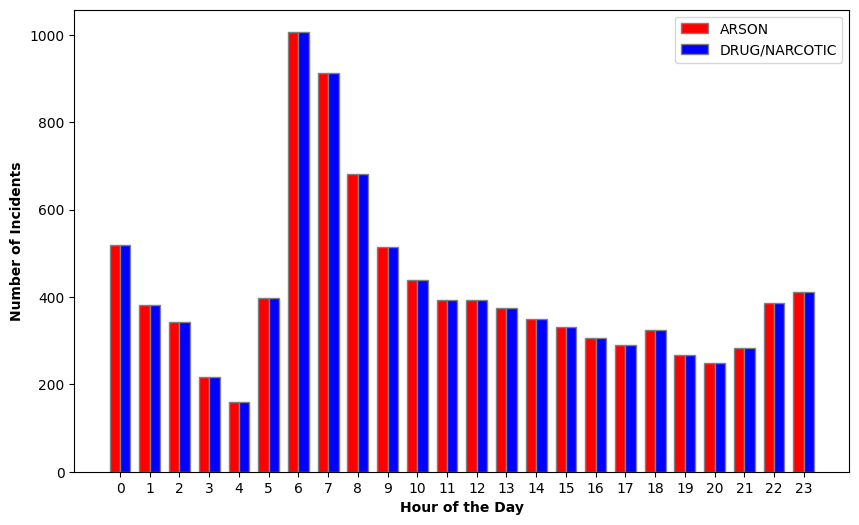

In [186]:
discon = data[data['Category'] == 'DISORDERLY CONDUCT']
discon_by_hour = discon.groupby('Hour').size().reset_index(name='Counts')
stole = data[data['Category'] == 'STOLEN PROPERTY']
stolen_by_hour = discon.groupby('Hour').size().reset_index(name='Counts')

hours = np.arange(24)  # 0 to 23 hours

fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.35

r1 = np.arange(24)
r2 = [x + bar_width for x in r1]

ax.bar(r1, discon_by_hour['Counts'], color='r', width=bar_width, edgecolor='grey', label='ARSON')

# Creating the bars for DRUG/NARCOTIC
ax.bar(r2, stolen_by_hour['Counts'], color='b', width=bar_width, edgecolor='grey', label='DRUG/NARCOTIC')

# Add some final touches
ax.set_xlabel('Hour of the Day', fontweight='bold')
ax.set_ylabel('Number of Incidents', fontweight='bold')
ax.set_xticks([r + bar_width/2 for r in range(24)])
ax.set_xticklabels([str(hour) for hour in hours])
ax.legend()

# Show the plot
plt.show()

## Map

In [19]:
peak_hours = [17, 18, 19]  # Example peak hours based on the evening
peak_crimes = data[data['Hour'].isin(peak_hours)]

In [42]:
import folium
from folium.plugins import HeatMap

# For the purpose of this example, let's generate some random data points within San Francisco's latitude and longitude
import numpy as np

# San Francisco latitude and longitude values
sf_latitude = 37.7749
sf_longitude = -122.4194


# Create the map centered around San Francisco
sf_map = folium.Map(location=[sf_latitude, sf_longitude], zoom_start=12)

heat_data = peak_crimes[['Y', 'X']].values.tolist()

# Create a HeatMap layer for the peak crime data

# Add the HeatMap layer to the map
HeatMap(heat_data, radius=13, blur=15, max_zoom=1).add_to(sf_map)

# Display the map
sf_map



### new attempt

In [59]:
data_cat = data[data['Category'] == "DRUG/NARCOTIC" ]

In [60]:
hour_12_data = data_cat[data_cat['Hour'] == 12][['Y', 'X']].values.tolist()
hour_18_data = data_cat[data_cat['Hour'] == 18][['Y', 'X']].values.tolist()


In [61]:
dual_map = DualMap(location=[sf_latitude, sf_longitude], zoom_start=13)
HeatMap(hour_12_data, radius=14, blur=15, max_zoom=1).add_to(dual_map.m1)
HeatMap(hour_18_data, radius=14, blur=15, max_zoom=1).add_to(dual_map.m2)
dual_map

### each hour

In [71]:

# Example DataFrame 'df' with 'Hour', 'Y' (latitude), and 'X' (longitude)

# Create a list of data for each hour
hourly_data = []
for hour in range(24):  # 0 to 23 hours
    hourly_data.append(data_cat[data_cat['Hour'] == hour][['Y', 'X']].dropna().values.tolist())


In [76]:
# Initialize a basic folium map
sf_map = folium.Map(location=[37.7749, -122.4194], zoom_start=12)

# Create the HeatMapWithTime
HeatMapWithTime(hourly_data, auto_play=True, max_opacity=0.8).add_to(sf_map)

# Display the map
sf_map


### NOTA THETTA

In [169]:
# Filter the dataframe for two categories
df_discon = data[data['Category'] == 'DISORDERLY CONDUCT'][['Hour', 'Y', 'X']]
df_stolen = data[data['Category'] == 'STOLEN PROPERTY'][['Hour', 'Y', 'X']]

# Prepare hourly data for each category
hourly_data_discon = [df_discon[df_discon['Hour'] == hour][['Y', 'X']].values.tolist() for hour in range(24)]
hourly_data_stolen = [df_stolen[df_stolen['Hour'] == hour][['Y', 'X']].values.tolist() for hour in range(24)]


In [171]:
# Create HeatMapWithTime for ASSAULT
map_discon = folium.Map(location=[37.7749, -122.4194], zoom_start=12)
HeatMapWithTime(hourly_data_discon, auto_play=True, max_opacity=0.8).add_to(map_discon)
map_discon.save('../images/discon_heatmap.html')

# Create HeatMapWithTime for stolen/NARCOTIC
map_stolen = folium.Map(location=[37.7749, -122.4194], zoom_start=12)
HeatMapWithTime(hourly_data_stolen, auto_play=True, max_opacity=0.8).add_to(map_stolen)
map_stolen.save('../images/stolen_heatmap.html')
